__Problem Statement__:

A US-based housing company named Surprise Housing has decided to enter the Australian market. The company uses data analytics to purchase houses at a price below their actual values and flip them on at a higher price. For the same purpose, the company has collected a data set from the sale of houses in Australia. The data is provided in the CSV file below.

The company is looking at prospective properties to buy to enter the market. You are required to build a regression model using regularisation in order to predict the actual value of the prospective properties and decide whether to invest in them or not.

Also, determine the optimal value of lambda for ridge and lasso regression.

In [1]:
# Importing the necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')

#### Step-1 Reading the Data set

In [2]:
# Reading the Dataset
housing=pd.read_csv("P:train.csv")
housing.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [3]:
# Identifying number of rows and columns
housing.shape

(1460, 81)

In [4]:
# Missing value check and getting to know the Data Type of each column
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

#### Here we can see that there are missing values present in our data set and we need to fix that before we move ahead with model building.

In [5]:
#All the null value columns
hnull=housing.isnull().sum()
hnull[hnull>0].sort_values(ascending=False)

PoolQC          1453
MiscFeature     1406
Alley           1369
Fence           1179
FireplaceQu      690
LotFrontage      259
GarageYrBlt       81
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
BsmtFinType2      38
BsmtExposure      38
BsmtFinType1      37
BsmtCond          37
BsmtQual          37
MasVnrArea         8
MasVnrType         8
Electrical         1
dtype: int64

In [6]:
# Percentage of Null values present in the data
pnull=round(housing.isnull().sum()/len(housing.index)*100,2)
pnull[pnull>0].sort_values(ascending=False)

PoolQC          99.52
MiscFeature     96.30
Alley           93.77
Fence           80.75
FireplaceQu     47.26
LotFrontage     17.74
GarageYrBlt      5.55
GarageType       5.55
GarageFinish     5.55
GarageQual       5.55
GarageCond       5.55
BsmtFinType2     2.60
BsmtExposure     2.60
BsmtFinType1     2.53
BsmtCond         2.53
BsmtQual         2.53
MasVnrArea       0.55
MasVnrType       0.55
Electrical       0.07
dtype: float64

In [7]:
#Dropping columns with more than 40% missing values
cols=housing.columns
for i in cols:
    if((100*(housing[i].isnull().sum()/len(housing.index)))>=40):
        housing.drop(i, 1, inplace = True)

In [8]:
# Checking if there are any duplicate values in the dataset.
housing[housing.duplicated(keep=False)]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,...,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


In [9]:
# Checking the shape our dataset now
housing.shape

(1460, 76)

#### We dropped 5 columns as they were having null value percentage more than 40%. For rest of the columns we can impute the data.

In [10]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 76 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

#### Missing values in Numerical Columns

In [11]:
# Imputing Null values with Median for Numeric columns i.e LotFrontage,GarageYrBlt and MasVnrArea
housing['LotFrontage'].fillna(housing['LotFrontage'].median(),inplace=True)
housing['GarageYrBlt'].fillna(housing['GarageYrBlt'].median(),inplace=True)
housing['MasVnrArea'].fillna(housing['MasVnrArea'].median(),inplace=True)

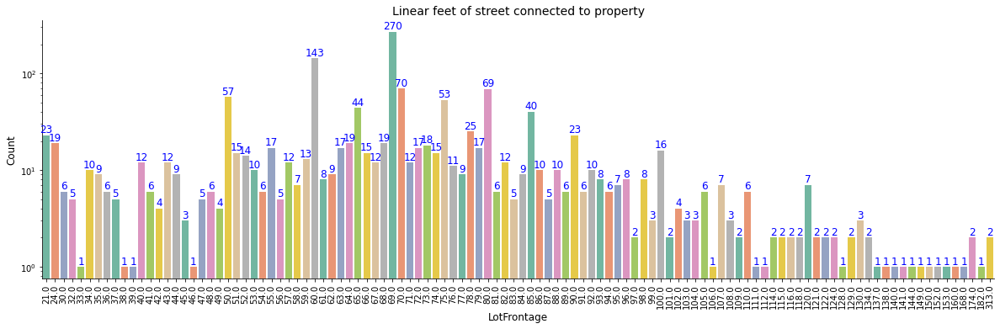

In [12]:
# Graph LotFrontage
plot=sns.catplot(x='LotFrontage',kind='count',data=housing,palette='Set2',aspect=3.3)
plt.title('Linear feet of street connected to property',fontsize=14)
plt.xlabel("LotFrontage",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.xticks(rotation=90)
plt.yscale('log')

# Code to print count on the Graph
ax = plot.facet_axis(0,0)
for p in ax.patches:        
    ax.text(p.get_x() + p.get_width()/(2),p.get_height(), p.get_height(),fontsize=12 ,color='blue', ha='center', va='bottom')
plt.show()

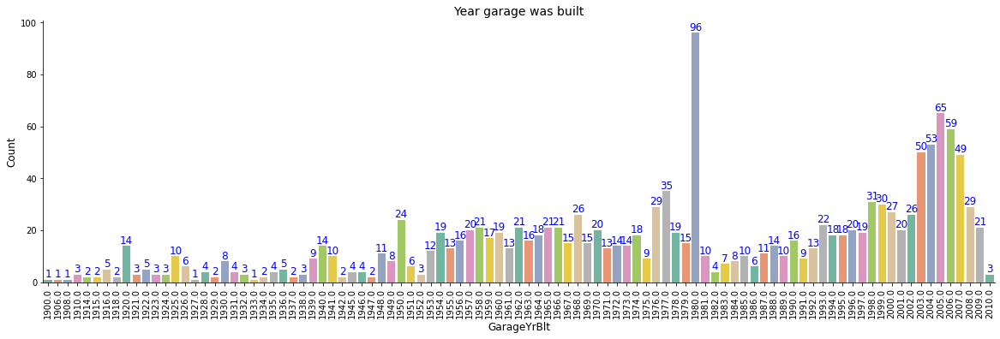

In [13]:
# Graph GarageYrBlt
plot=sns.catplot(x='GarageYrBlt',kind='count',data=housing,palette='Set2',aspect=3.25)
plt.title('Year garage was built',fontsize=14)
plt.xlabel("GarageYrBlt",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.xticks(rotation=90)
#plt.yscale('log')

# Code to print count on the Graph
ax = plot.facet_axis(0,0)
for p in ax.patches:        
    ax.text(p.get_x() + p.get_width()/(2),p.get_height(), p.get_height(),fontsize=12 ,color='blue', ha='center', va='bottom')
plt.show()

#### Missing Values in Categorical Columns

#### GarageType

In [14]:
# GarageType
round(housing['GarageType'].value_counts(normalize=True)*100,2)

Attchd     63.09
Detchd     28.06
BuiltIn     6.38
Basment     1.38
CarPort     0.65
2Types      0.44
Name: GarageType, dtype: float64

In [15]:
# Imputing nullvalues for GarageType column with No Garage as we are not sure about the location of Garage
housing['GarageType'].fillna("No Garage", inplace=True)

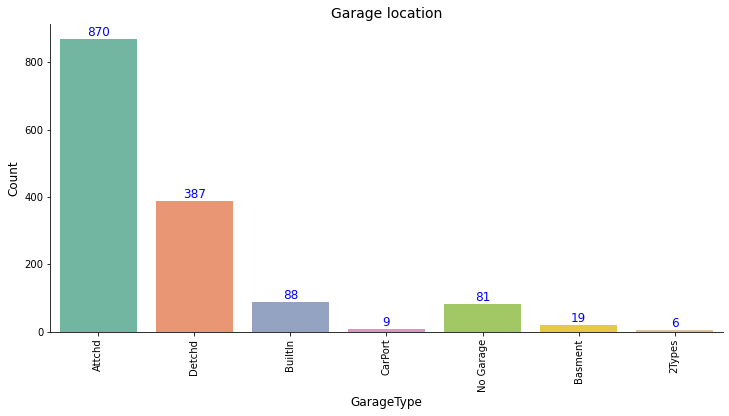

In [16]:
# Graph
plot=sns.catplot(x='GarageType',kind='count',data=housing,palette="Set2",aspect=2)
plt.title('Garage location',fontsize=14)
plt.xlabel("GarageType",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.xticks(rotation=90)
#plt.yscale('log')

# Code to print count on the Graph
ax = plot.facet_axis(0,0)
for p in ax.patches:        
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), p.get_height(), fontsize=12, color='blue', ha='center', va='bottom')
    
plt.show()

#### GarageFinish

In [17]:
# GarageFinish
round(housing['GarageFinish'].value_counts(normalize=True)*100,2)

Unf    43.87
RFn    30.60
Fin    25.53
Name: GarageFinish, dtype: float64

In [18]:
# Imputing nullvalues for GarageFinish column with No Garage as we are not sure about the Garage
housing['GarageFinish'].fillna("No Garage", inplace=True)

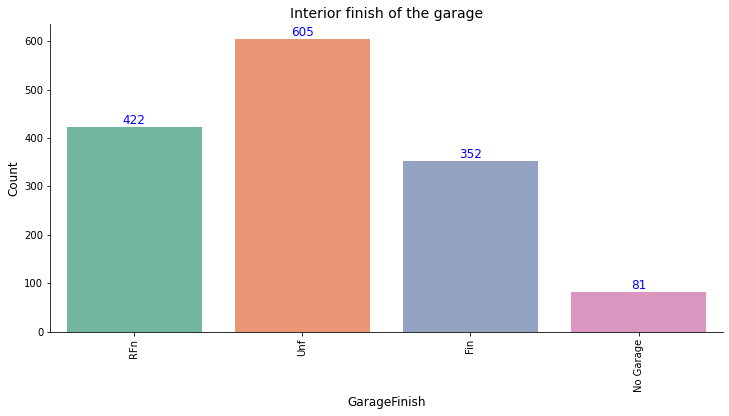

In [19]:
# Graph
plot=sns.catplot(x='GarageFinish',kind='count',data=housing,palette="Set2",aspect=2)
plt.title('Interior finish of the garage',fontsize=14)
plt.xlabel("GarageFinish",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.xticks(rotation=90)
#plt.yscale('log')

# Code to print count on the Graph
ax = plot.facet_axis(0,0)
for p in ax.patches:        
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), p.get_height(), fontsize=12, color='blue', ha='center', va='bottom')
    
plt.show()

In [20]:
# GarageQual
round(housing['GarageQual'].value_counts(normalize=True)*100,2)

TA    95.07
Fa     3.48
Gd     1.02
Ex     0.22
Po     0.22
Name: GarageQual, dtype: float64

#### GarageQual is a skewed column as partcular set of options over here explain 90% of the values. We need to drop this column.

In [21]:
# Dropping GarageQual as it is a skewed column
housing.drop(['GarageQual'],axis=1,inplace=True)

#### GarageCond

In [22]:
# GarageCond
round(housing['GarageCond'].value_counts(normalize=True)*100,2)

TA    96.16
Fa     2.54
Gd     0.65
Po     0.51
Ex     0.15
Name: GarageCond, dtype: float64

In [23]:
# Dropping GarageCond as it is a skewed column
housing.drop(['GarageCond'],axis=1,inplace=True)

#### BsmtFinType2

In [24]:
# BsmtFinType2
round(housing['BsmtFinType2'].value_counts(normalize=True)*100,2)

Unf    88.33
Rec     3.80
LwQ     3.23
BLQ     2.32
ALQ     1.34
GLQ     0.98
Name: BsmtFinType2, dtype: float64

In [25]:
# Dropping GarageCond as it is a skewed column
housing.drop(['BsmtFinType2'],axis=1,inplace=True)

#### BsmtExposure 

In [26]:
#BsmtExposure
round(housing['BsmtExposure'].value_counts(normalize=True)*100,2)

No    67.02
Av    15.54
Gd     9.42
Mn     8.02
Name: BsmtExposure, dtype: float64

In [27]:
# Dropping GarageCond as it is a skewed column
housing.drop(['BsmtExposure'],axis=1,inplace=True)

#### BsmtFinType1

In [28]:
#BsmtFinType1
round(housing['BsmtFinType1'].value_counts(normalize=True)*100,2)

Unf    30.22
GLQ    29.37
ALQ    15.46
BLQ    10.40
Rec     9.35
LwQ     5.20
Name: BsmtFinType1, dtype: float64

In [29]:
# Imputing nullvalues for BsmtFinType1 column with No Basement as we dont have a basement.
housing['BsmtFinType1'].fillna("No Basement",inplace=True)

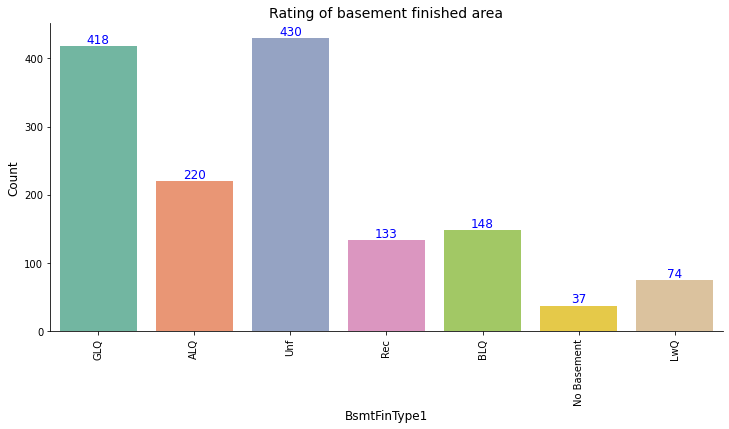

In [30]:
# Graph
plot=sns.catplot(x='BsmtFinType1',kind='count',data=housing,palette="Set2",aspect=2)
plt.title('Rating of basement finished area',fontsize=14)
plt.xlabel("BsmtFinType1",fontsize=12)
plt.ylabel("Count",fontsize=12)
plt.xticks(rotation=90)
#plt.yscale('log')

# Code to print count on the Graph
ax = plot.facet_axis(0,0)
for p in ax.patches:        
    ax.text(p.get_x() + p.get_width()/2., p.get_height(), p.get_height(), fontsize=12, color='blue', ha='center', va='bottom')
    
plt.show()

#### BsmtCond

In [31]:
#BsmtCond
round(housing['BsmtCond'].value_counts(normalize=True)*100,2)

TA    92.13
Gd     4.57
Fa     3.16
Po     0.14
Name: BsmtCond, dtype: float64

In [32]:
# Dropping BsmtCond as it is a skewed column
housing.drop(['BsmtCond'],axis=1,inplace=True)

#### BsmtQual

In [33]:
#BsmtQual
round(housing['BsmtQual'].value_counts(normalize=True)*100,2)

TA    45.61
Gd    43.43
Ex     8.50
Fa     2.46
Name: BsmtQual, dtype: float64

In [34]:
# Dropping BsmtQual as it is a skewed column
housing.drop(['BsmtQual'],axis=1,inplace=True)

#### MasVnrType

In [35]:
#MasVnrType
round(housing['MasVnrType'].value_counts(normalize=True)*100,2)

None       59.50
BrkFace    30.65
Stone       8.82
BrkCmn      1.03
Name: MasVnrType, dtype: float64

In [36]:
# Dropping MasVnrType as it is a skewed column
housing.drop(['MasVnrType'],axis=1,inplace=True)

#### Electrical

In [37]:
#Electrical
round(housing['Electrical'].value_counts(normalize=True)*100,2)

SBrkr    91.43
FuseA     6.44
FuseF     1.85
FuseP     0.21
Mix       0.07
Name: Electrical, dtype: float64

In [38]:
# Dropping Electrical as it is a skewed column
housing.drop(['Electrical'],axis=1,inplace=True)

#### We have dropped all the unecessary categorical columns which were not required.

In [39]:
## Checking the Shape of the dataset now
housing.shape

(1460, 68)

In [40]:
## Checking the Null values in the dataset now
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 68 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1460 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   LotShape       1460 non-null   object 
 7   LandContour    1460 non-null   object 
 8   Utilities      1460 non-null   object 
 9   LotConfig      1460 non-null   object 
 10  LandSlope      1460 non-null   object 
 11  Neighborhood   1460 non-null   object 
 12  Condition1     1460 non-null   object 
 13  Condition2     1460 non-null   object 
 14  BldgType       1460 non-null   object 
 15  HouseStyle     1460 non-null   object 
 16  OverallQual    1460 non-null   int64  
 17  OverallCond    1460 non-null   int64  
 18  YearBuil

In [41]:
# Dropping Id as it is not required
housing.drop(['Id'],axis=1,inplace=True)

#### Year Columns

In [42]:
#GarageYrBlt
housing['GarageYrBlt']

0       2003.0
1       1976.0
2       2001.0
3       1998.0
4       2000.0
         ...  
1455    1999.0
1456    1978.0
1457    1941.0
1458    1950.0
1459    1965.0
Name: GarageYrBlt, Length: 1460, dtype: float64

In [43]:
#YearRemodAdd
housing['YearRemodAdd']

0       2003
1       1976
2       2002
3       1970
4       2000
        ... 
1455    2000
1456    1988
1457    2006
1458    1996
1459    1965
Name: YearRemodAdd, Length: 1460, dtype: int64

In [44]:
#YearBuilt
housing['YearBuilt']

0       2003
1       1976
2       2001
3       1915
4       2000
        ... 
1455    1999
1456    1978
1457    1941
1458    1950
1459    1965
Name: YearBuilt, Length: 1460, dtype: int64

In [45]:
#YrSold
housing['YrSold']

0       2008
1       2007
2       2008
3       2006
4       2008
        ... 
1455    2007
1456    2010
1457    2010
1458    2010
1459    2008
Name: YrSold, Length: 1460, dtype: int64

In [46]:
#Converting Years To Days from Present
#Converting dates (YearBuilt, YearRemodAdd, GarageYrBlt) to days (DiffYearBuilt, DiffYearRemodAdd, DiffGarageYrBlt) from today
housing['DiffYearBuilt'] = pd.datetime.now().year - housing['YearBuilt']
housing['DiffYearRemodAdd'] = pd.datetime.now().year - housing['YearRemodAdd']
housing['DiffGarageYrBlt'] = pd.datetime.now().year - housing['GarageYrBlt']
housing['DiffYrSold'] = pd.datetime.now().year - housing['YrSold']

In [47]:
# Dropping some of the Yr Columns since we have the Age of certain 'Yr' columns from present date.
housing.drop(['YearRemodAdd','GarageYrBlt','YrSold'],axis=1,inplace=True)

In [48]:
housing_numerical=housing[['MSSubClass', 'LotFrontage', 'LotArea', 'OverallQual', 'OverallCond',
       'YearBuilt', 'MasVnrArea', 'BsmtFinSF1', 'BsmtFinSF2', 'BsmtUnfSF',
       'TotalBsmtSF', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'TotRmsAbvGrd', 'Fireplaces', 'GarageCars',
       'GarageArea', 'WoodDeckSF', 'OpenPorchSF', 'EnclosedPorch', '3SsnPorch',
       'ScreenPorch', 'PoolArea', 'MiscVal', 'MoSold', 'SalePrice',
       'DiffYearBuilt', 'DiffYearRemodAdd', 'DiffGarageYrBlt', 'DiffYrSold']]

In [49]:
# Checking statistical data of different columns at 25%, 50%, 75%, 90%, 95% and 99%
housing_numerical.describe(percentiles=[.25, .5, .75, .90, .95, .99])

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,...,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SalePrice,DiffYearBuilt,DiffYearRemodAdd,DiffGarageYrBlt,DiffYrSold
count,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,56.897260,69.863699,10516.828082,6.099315,5.575342,1971.267808,103.117123,443.639726,46.549315,567.240411,...,3.409589,15.060959,2.758904,43.489041,6.321918,180921.195890,49.732192,36.134247,42.410959,13.184247
std,42.300571,22.027677,9981.264932,1.382997,1.112799,30.202904,180.731373,456.098091,161.319273,441.866955,...,29.317331,55.757415,40.177307,496.123024,2.703626,79442.502883,30.202904,20.645407,23.997022,1.328095
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,34900.000000,11.000000,11.000000,11.000000,11.000000
25%,20.000000,60.000000,7553.500000,5.000000,5.000000,1954.000000,0.000000,0.000000,0.000000,223.000000,...,0.000000,0.000000,0.000000,0.000000,5.000000,129975.000000,21.000000,17.000000,20.000000,12.000000
50%,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,0.000000,383.500000,0.000000,477.500000,...,0.000000,0.000000,0.000000,0.000000,6.000000,163000.000000,48.000000,27.000000,41.000000,13.000000
75%,70.000000,79.000000,11601.500000,7.000000,6.000000,2000.000000,164.250000,712.250000,0.000000,808.000000,...,0.000000,0.000000,0.000000,0.000000,8.000000,214000.000000,67.000000,54.000000,59.000000,14.000000
90%,120.000000,92.000000,14381.700000,8.000000,7.000000,2006.000000,335.000000,1065.500000,117.200000,1232.000000,...,0.000000,0.000000,0.000000,0.000000,10.000000,278000.000000,96.100000,71.000000,73.000000,15.000000
95%,160.000000,104.000000,17401.150000,8.000000,8.000000,2007.000000,456.000000,1274.000000,396.200000,1468.000000,...,0.000000,160.000000,0.000000,0.000000,11.000000,326100.000000,105.000000,71.000000,91.000000,15.000000
99%,190.000000,137.410000,37567.640000,10.000000,9.000000,2009.000000,791.280000,1572.410000,830.380000,1797.050000,...,168.000000,268.050000,0.000000,700.000000,12.000000,442567.010000,121.820000,71.000000,103.820000,15.000000


In [50]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 68 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MSSubClass        1460 non-null   int64  
 1   MSZoning          1460 non-null   object 
 2   LotFrontage       1460 non-null   float64
 3   LotArea           1460 non-null   int64  
 4   Street            1460 non-null   object 
 5   LotShape          1460 non-null   object 
 6   LandContour       1460 non-null   object 
 7   Utilities         1460 non-null   object 
 8   LotConfig         1460 non-null   object 
 9   LandSlope         1460 non-null   object 
 10  Neighborhood      1460 non-null   object 
 11  Condition1        1460 non-null   object 
 12  Condition2        1460 non-null   object 
 13  BldgType          1460 non-null   object 
 14  HouseStyle        1460 non-null   object 
 15  OverallQual       1460 non-null   int64  
 16  OverallCond       1460 non-null   int64  


In [51]:
# Changing MSSubClass into categorical Varibale
def chn_MSSubClass(x):
    return x.map({
        20:'1-STORY 1946 & NEWER ALL STYLES',
        30:'1-STORY 1945 & OLDER',
        40:'1-STORY W/FINISHED ATTIC ALL AGES',
        45:'1-1/2 STORY - UNFINISHED ALL AGES',
        50:'1-1/2 STORY FINISHED ALL AGES',
        60:'2-STORY 1946 & NEWER',
        70:'2-STORY 1945 & OLDER',
        75:'2-1/2 STORY ALL AGES',
        80:'SPLIT OR MULTI-LEVEL',
        85:'SPLIT FOYER',
        90:'DUPLEX - ALL STYLES AND AGES',
       120:'1-STORY PUD (Planned Unit Development) - 1946 & NEWER',
       150:'1-1/2 STORY PUD - ALL AGES',
       160:'2-STORY PUD - 1946 & NEWER',
       180:'PUD - MULTILEVEL - INCL SPLIT LEV/FOYER',
       190:'2 FAMILY CONVERSION - ALL STYLES AND AGES',
})
housing[['MSSubClass']]=housing[['MSSubClass']].apply(chn_MSSubClass)

In [52]:
# Changing OverallQual into categorical Varibale
def chn_OverallQual(x):
    return x.map({
        10:'Very Excellent',
        9:'Excellent',
        8:'Very Good',
        7:'Good',
        6:'Above Average',
        5:'Average',
        4:'Below Average',
        3:'Fair',
        2:'Poor',
        1:'Very Poor',
})
housing[['OverallQual']]=housing[['OverallQual']].apply(chn_OverallQual)

In [53]:
# Changing OverallQual into categorical Varibale
def chn_OverallCond(x):
    return x.map({
        10:'Very Excellent',
        9:'Excellent',
        8:'Very Good',
        7:'Good',
        6:'Above Average',
        5:'Average',
        4:'Below Average',
        3:'Fair',
        2:'Poor',
        1:'Very Poor',
})
housing[['OverallCond']]=housing[['OverallCond']].apply(chn_OverallCond)

In [54]:
#Changing Datatype of above variables from int to Object Type
housing['MSSubClass']=housing['MSSubClass'].astype('object')
housing['OverallQual']=housing['OverallQual'].astype('object')
housing['OverallCond']=housing['OverallCond'].astype('object')

In [55]:
housing.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 68 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   MSSubClass        1460 non-null   object 
 1   MSZoning          1460 non-null   object 
 2   LotFrontage       1460 non-null   float64
 3   LotArea           1460 non-null   int64  
 4   Street            1460 non-null   object 
 5   LotShape          1460 non-null   object 
 6   LandContour       1460 non-null   object 
 7   Utilities         1460 non-null   object 
 8   LotConfig         1460 non-null   object 
 9   LandSlope         1460 non-null   object 
 10  Neighborhood      1460 non-null   object 
 11  Condition1        1460 non-null   object 
 12  Condition2        1460 non-null   object 
 13  BldgType          1460 non-null   object 
 14  HouseStyle        1460 non-null   object 
 15  OverallQual       1460 non-null   object 
 16  OverallCond       1460 non-null   object 


In [56]:
housing.shape

(1460, 68)

In [57]:
housing.head()

,MSSubClass,MSZoning,LotFrontage,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,...,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice,DiffYearBuilt,DiffYearRemodAdd,DiffGarageYrBlt,DiffYrSold
0,2-STORY 1946 & NEWER,RL,65.0,8450,Pave,Reg,Lvl,AllPub,Inside,Gtl,...,0,0,2,WD,Normal,208500,18,18,18.0,13
1,1-STORY 1946 & NEWER ALL STYLES,RL,80.0,9600,Pave,Reg,Lvl,AllPub,FR2,Gtl,...,0,0,5,WD,Normal,181500,45,45,45.0,14
2,2-STORY 1946 & NEWER,RL,68.0,11250,Pave,IR1,Lvl,AllPub,Inside,Gtl,...,0,0,9,WD,Normal,223500,20,19,20.0,13
3,2-STORY 1945 & OLDER,RL,60.0,9550,Pave,IR1,Lvl,AllPub,Corner,Gtl,...,0,0,2,WD,Abnorml,140000,106,51,23.0,15
4,2-STORY 1946 & NEWER,RL,84.0,14260,Pave,IR1,Lvl,AllPub,FR2,Gtl,...,0,0,12,WD,Normal,250000,21,21,21.0,13


In [58]:
# All Categorical Columnns
cat=housing.select_dtypes(include=['object'])
cat.columns

Index(['MSSubClass', 'MSZoning', 'Street', 'LotShape', 'LandContour',
       'Utilities', 'LotConfig', 'LandSlope', 'Neighborhood', 'Condition1',
       'Condition2', 'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'ExterQual',
       'ExterCond', 'Foundation', 'BsmtFinType1', 'Heating', 'HeatingQC',
       'CentralAir', 'KitchenQual', 'Functional', 'GarageType', 'GarageFinish',
       'PavedDrive', 'SaleType', 'SaleCondition'],
      dtype='object')

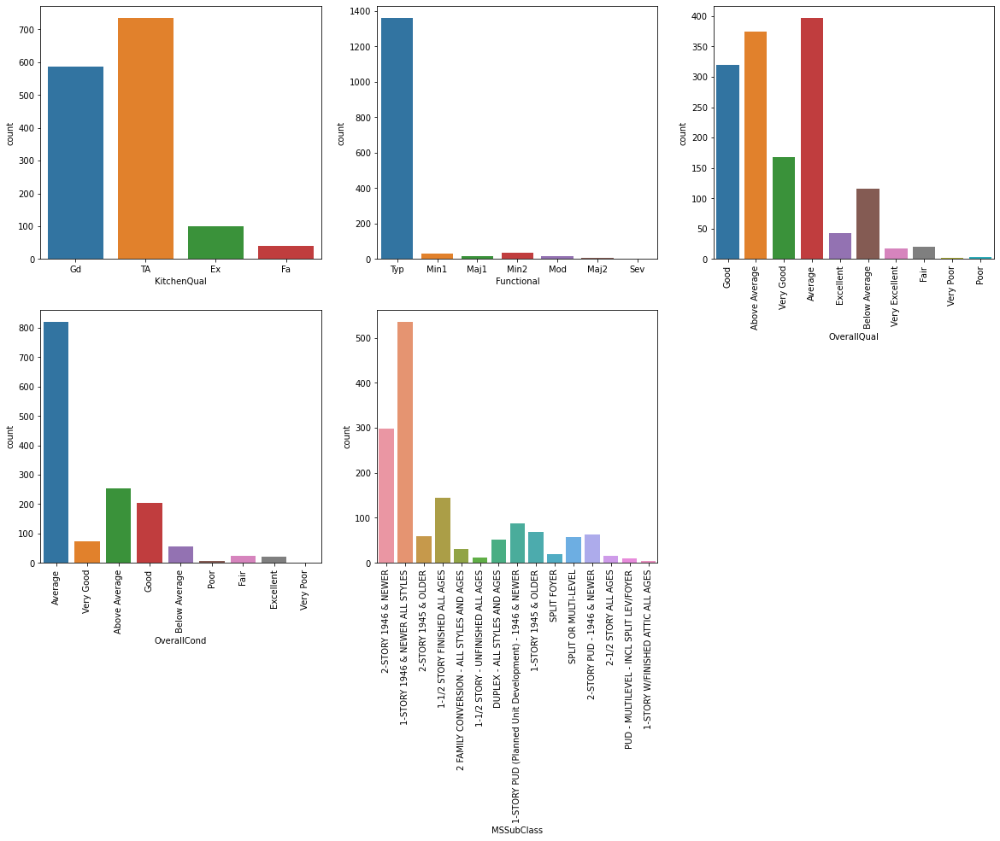

In [59]:
#Countplot-1
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.countplot(x = 'KitchenQual',  data = housing)
plt.subplot(2,3,2)
sns.countplot(x = 'Functional', data = housing)
plt.subplot(2,3,3)
sns.countplot(x = 'OverallQual', data = housing)
plt.xticks(rotation=90)
plt.subplot(2,3,4)
sns.countplot(x = 'OverallCond', data = housing)
plt.xticks(rotation=90)
plt.subplot(2,3,5)
sns.countplot(x = 'MSSubClass',  data = housing)
plt.xticks(rotation=90)

plt.show()

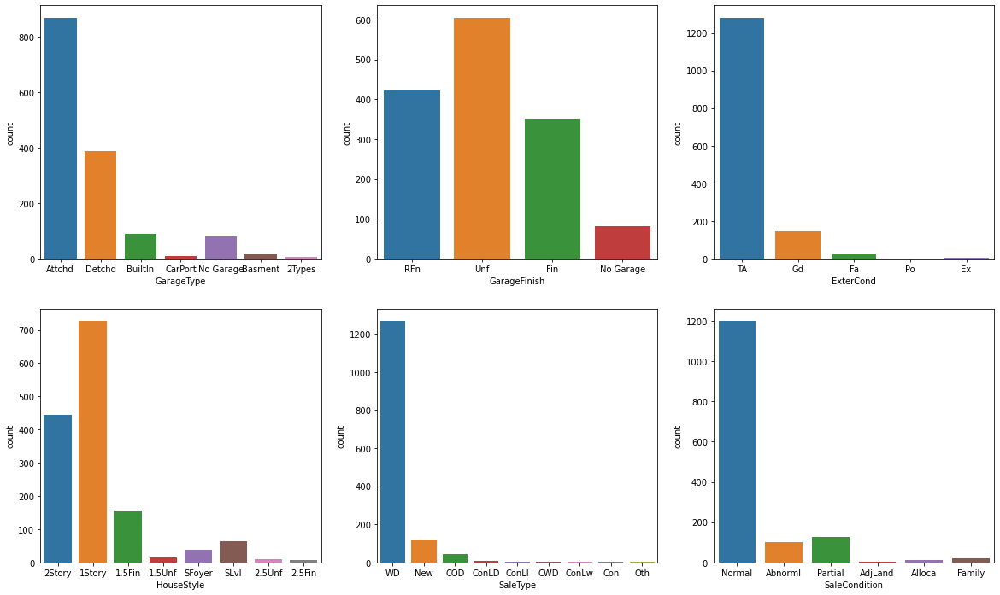

In [60]:
# Countplot-2
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.countplot(x = 'GarageType',  data = housing)
plt.subplot(2,3,2)
sns.countplot(x = 'GarageFinish', data = housing)
plt.subplot(2,3,3)
sns.countplot(x = 'ExterCond', data = housing)
plt.subplot(2,3,4)
sns.countplot(x = 'HouseStyle', data = housing)
plt.subplot(2,3,5)
sns.countplot(x = 'SaleType',  data = housing)
plt.subplot(2,3,6)
sns.countplot(x = 'SaleCondition', data = housing)
plt.show()

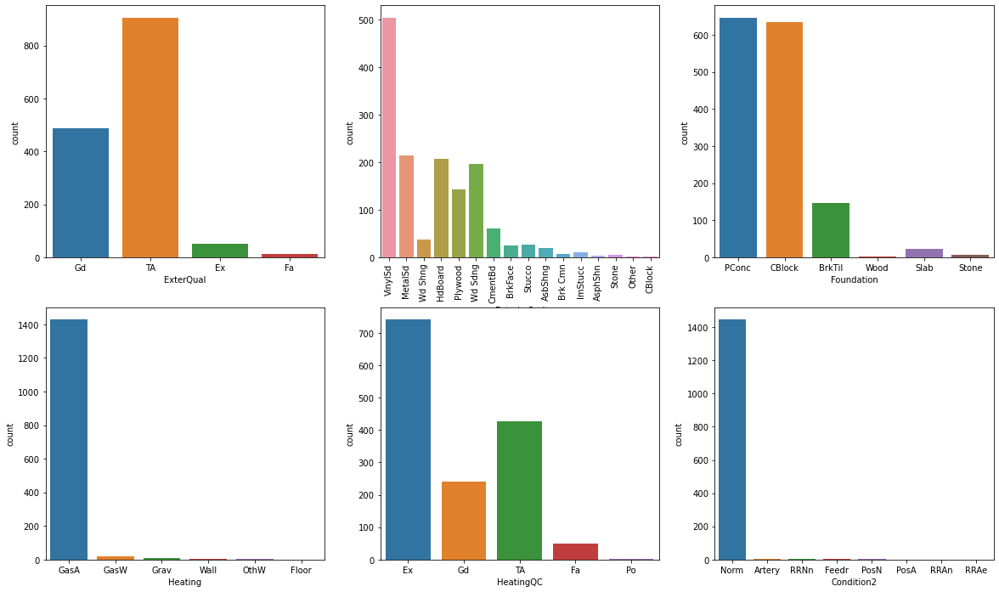

In [61]:
#Countplot-3
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.countplot(x = 'ExterQual',  data = housing)
plt.subplot(2,3,2)
sns.countplot(x = 'Exterior2nd', data = housing)
plt.xticks(rotation=90)
plt.subplot(2,3,3)
sns.countplot(x = 'Foundation', data = housing)
plt.subplot(2,3,4)
sns.countplot(x = 'Heating', data = housing)
plt.subplot(2,3,5)
sns.countplot(x = 'HeatingQC',  data = housing)
plt.subplot(2,3,6)
sns.countplot(x = 'Condition2', data = housing)
plt.show()

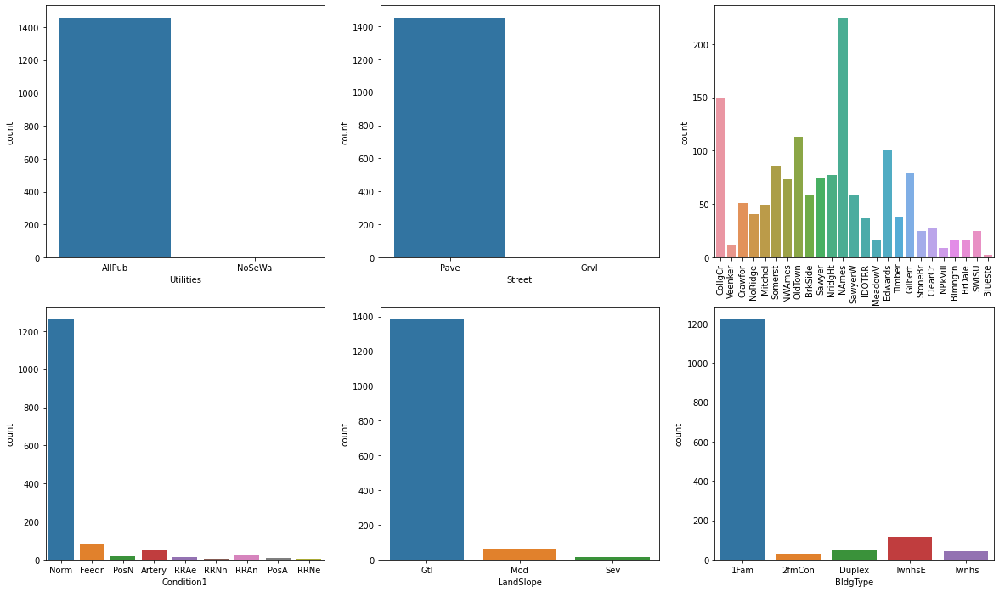

In [62]:
#Countplot-4
plt.figure(figsize=(20, 12))
plt.subplot(2,3,1)
sns.countplot(x = 'Utilities',  data = housing)
plt.subplot(2,3,2)
sns.countplot(x = 'Street', data = housing)
plt.subplot(2,3,3)
sns.countplot(x = 'Neighborhood', data = housing)
plt.xticks(rotation=90)
plt.subplot(2,3,4)
sns.countplot(x = 'Condition1', data = housing)
plt.subplot(2,3,5)
sns.countplot(x = 'LandSlope',  data = housing)
plt.subplot(2,3,6)
sns.countplot(x = 'BldgType', data = housing)
plt.show()

In [63]:
# From the abobve graphs we can see that there some more skewed columns which need to be dropped
housing.drop(['Functional','SaleType','Heating','Condition1','Condition2','Utilities','Street'],axis=1,inplace=True)

In [64]:
# All Numerical Columnns
num=housing.select_dtypes(include=['int64','float64'])
num.columns

Index(['LotFrontage', 'LotArea', 'YearBuilt', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold', 'SalePrice', 'DiffYearBuilt', 'DiffYearRemodAdd',
       'DiffGarageYrBlt', 'DiffYrSold'],
      dtype='object')

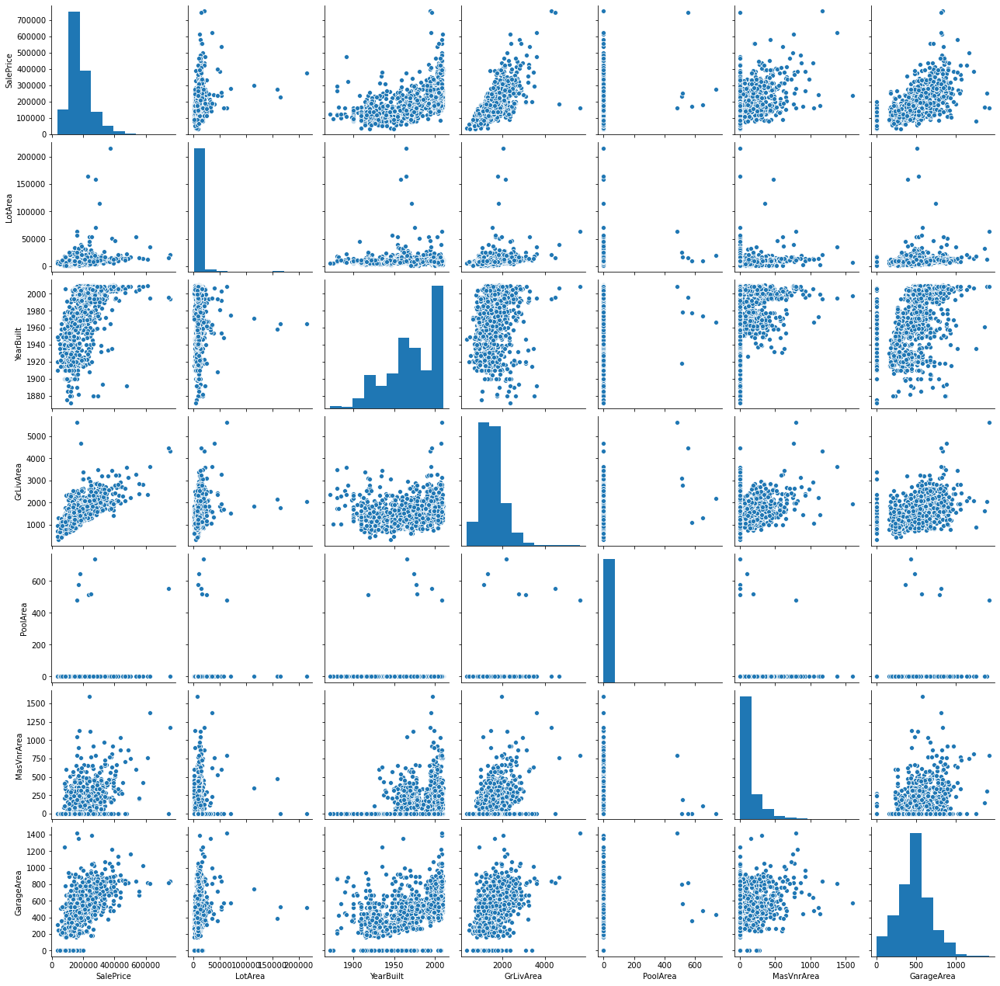

In [65]:
# PairPlots
num=['SalePrice','LotArea','YearBuilt','GrLivArea','PoolArea','MasVnrArea','GarageArea']
sns.pairplot(housing[num],size=2.5)

#### Target Variable-Sales Price

In [66]:
# Checking our Target Variable Price
housing['SalePrice']

0       208500
1       181500
2       223500
3       140000
4       250000
         ...  
1455    175000
1456    210000
1457    266500
1458    142125
1459    147500
Name: SalePrice, Length: 1460, dtype: int64

In [67]:
round(housing['SalePrice'].value_counts(normalize=True)*100,2)

140000    1.37
135000    1.16
145000    0.96
155000    0.96
190000    0.89
          ... 
84900     0.07
424870    0.07
415298    0.07
62383     0.07
34900     0.07
Name: SalePrice, Length: 663, dtype: float64

In [68]:
# Skewness present in the SalesPrice
from scipy import stats
housing['SalePrice'].skew()

1.8828757597682129

In [69]:
#Kurtosis
housing['SalePrice'].kurtosis()

6.536281860064529

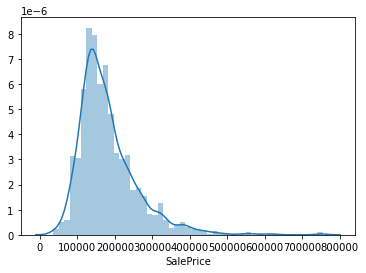

In [70]:
# Checking the Distribution for our Target Variable and here it is not normal
sns.distplot(housing['SalePrice'])

In [71]:
#### Skewness and Kurtosis after Normal Distribution

In [72]:
# Carrying out Transformation to bring it to Normal Disytribution
housing['SalePrice']=np.log(housing.SalePrice)

In [73]:
#Kurtosis
housing['SalePrice'].kurtosis()

0.8095319958036296

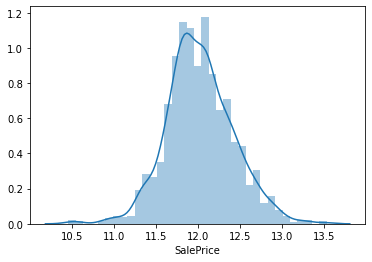

In [74]:
# Checking the Distribution for our Target Variable and here it is a normal distribution
sns.distplot(housing['SalePrice'])

In [75]:
# Skewness present in the SalesPrice
from scipy import stats
housing['SalePrice'].skew()

0.12133506220520406

In [76]:
cat=housing.select_dtypes(include=['object'])
cat.columns

Index(['MSSubClass', 'MSZoning', 'LotShape', 'LandContour', 'LotConfig',
       'LandSlope', 'Neighborhood', 'BldgType', 'HouseStyle', 'OverallQual',
       'OverallCond', 'RoofStyle', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'ExterQual', 'ExterCond', 'Foundation', 'BsmtFinType1', 'HeatingQC',
       'CentralAir', 'KitchenQual', 'GarageType', 'GarageFinish', 'PavedDrive',
       'SaleCondition'],
      dtype='object')

### Step-2 Data Preparation

In [77]:
# Binary Vars to 1 and 0
def chn_CentralAir(x):
    return x.map({
        'Y':1,
        'N':0,
})
housing[['CentralAir']]=housing[['CentralAir']].apply(chn_CentralAir)

In [78]:
# Changing the DataType of the Variable
housing['CentrailAir']=housing['CentralAir'].astype('int64')

#### Dummy Variables Creation for our Categorical Variables

In [79]:
# Creating Dummy Variables
housing_MSSubClass=pd.get_dummies(housing['MSSubClass'], prefix='MSSubClass',drop_first=True)
housing_MSZoning=pd.get_dummies(housing['MSZoning'], prefix= 'MSZoning',drop_first=True)
housing_LotShape=pd.get_dummies(housing['LotShape'], prefix='LotShape',drop_first=True)
housing_LandContour=pd.get_dummies(housing['LandContour'], prefix='LandContour',drop_first=True)
housing_LotConfig=pd.get_dummies(housing['LotConfig'], prefix='LotConfig',drop_first=True)
housing_LandSlope=pd.get_dummies(housing['LandSlope'],prefix= 'LandSlope',drop_first=True)
housing_Neighborhood=pd.get_dummies(housing['Neighborhood'],prefix='Neighborhood',drop_first=True)
housing_BldgType=pd.get_dummies(housing['BldgType'],prefix='BldgType',drop_first=True)
housing_HouseStyle=pd.get_dummies(housing['HouseStyle'],prefix='HouseStyle',drop_first=True)
housing_OverallQual=pd.get_dummies(housing['OverallQual'],prefix='OverallQual',drop_first=True)
housing_OverallCond=pd.get_dummies(housing['OverallCond'],prefix='OverallCond',drop_first=True)

housing_RoofStyle=pd.get_dummies(housing['RoofStyle'],prefix='RoofStyle',drop_first=True)
housing_RoofMatl=pd.get_dummies(housing['RoofMatl'],prefix='RoofMatl',drop_first=True)
housing_Exterior1st=pd.get_dummies(housing['Exterior1st'],prefix='Exterior1st',drop_first=True)
housing_Exterior2nd=pd.get_dummies(housing['Exterior2nd'],prefix='Exterior2nd',drop_first=True)
housing_ExterQual=pd.get_dummies(housing['ExterQual'],prefix='ExterQual',drop_first=True)
housing_ExterCond=pd.get_dummies(housing['ExterCond'],prefix='ExterCond',drop_first=True)

housing_Foundation=pd.get_dummies(housing['Foundation'],prefix='Foundation',drop_first=True)
housing_BsmtFinType1=pd.get_dummies(housing['BsmtFinType1'],prefix='BsmtFinType1',drop_first=True)
housing_HeatingQC=pd.get_dummies(housing['HeatingQC'],prefix='HeatingQC',drop_first=True)
housing_KitchenQual=pd.get_dummies(housing['KitchenQual'],prefix='KitchenQual',drop_first=True)

housing_GarageType=pd.get_dummies(housing['GarageType'],prefix='GarageType',drop_first=True)
housing_GarageFinish=pd.get_dummies(housing['GarageFinish'],prefix='GarageFinish',drop_first=True)
housing_SaleCondition=pd.get_dummies(housing['SaleCondition'],prefix='SaleCondition',drop_first=True)
housing_PavedDrive=pd.get_dummies(housing['PavedDrive'], prefix='PavedDrive',drop_first=True)

In [80]:
# Concatenating with the Dataset
housing=pd.concat([housing,housing_MSSubClass],axis=1)
housing=pd.concat([housing,housing_MSZoning],axis=1)
housing=pd.concat([housing,housing_LotShape],axis=1)
housing=pd.concat([housing,housing_LotConfig],axis=1)

housing=pd.concat([housing,housing_LandSlope],axis=1)
housing=pd.concat([housing,housing_Neighborhood],axis=1)
housing=pd.concat([housing,housing_HouseStyle],axis=1)
housing=pd.concat([housing,housing_OverallQual],axis=1)
housing=pd.concat([housing,housing_OverallCond],axis=1)
housing=pd.concat([housing,housing_RoofStyle],axis=1)

housing=pd.concat([housing,housing_RoofMatl],axis=1)
housing=pd.concat([housing,housing_Exterior1st],axis=1)
housing=pd.concat([housing,housing_Exterior2nd],axis=1)
housing=pd.concat([housing,housing_ExterQual],axis=1)
housing=pd.concat([housing,housing_ExterCond],axis=1)
housing=pd.concat([housing,housing_Foundation],axis=1)
housing=pd.concat([housing,housing_BsmtFinType1],axis=1)

housing=pd.concat([housing,housing_HeatingQC],axis=1)
housing=pd.concat([housing,housing_KitchenQual],axis=1)
housing=pd.concat([housing,housing_GarageType],axis=1)
housing=pd.concat([housing,housing_GarageFinish],axis=1)
housing=pd.concat([housing,housing_SaleCondition],axis=1)
housing=pd.concat([housing,housing_PavedDrive],axis=1)


In [81]:
# Now we Drop the redundant columns
housing.drop(['MSSubClass'],axis=1,inplace=True)
housing.drop(['MSZoning'],axis=1,inplace=True)

housing.drop(['LotShape'],axis=1,inplace=True)
housing.drop(['LandContour'],axis=1,inplace=True)
housing.drop(['LandSlope'],axis=1,inplace=True)
housing.drop(['LotConfig'],axis=1,inplace=True)
housing.drop(['Neighborhood'],axis=1,inplace=True)
housing.drop(['BldgType'],axis=1,inplace=True)
housing.drop(['HouseStyle'],axis=1,inplace=True)

housing.drop(['OverallQual'],axis=1,inplace=True)
housing.drop(['OverallCond'],axis=1,inplace=True)
housing.drop(['RoofStyle'],axis=1,inplace=True)
housing.drop(['RoofMatl'],axis=1,inplace=True)
housing.drop(['Exterior1st'],axis=1,inplace=True)


housing.drop(['Exterior2nd'],axis=1,inplace=True)
housing.drop(['ExterQual'],axis=1,inplace=True)
housing.drop(['ExterCond'],axis=1,inplace=True)
housing.drop(['Foundation'],axis=1,inplace=True)
housing.drop(['BsmtFinType1'],axis=1,inplace=True)
housing.drop(['HeatingQC'],axis=1,inplace=True)
housing.drop(['KitchenQual'],axis=1,inplace=True)
housing.drop(['GarageType'],axis=1,inplace=True)
housing.drop(['GarageFinish'],axis=1,inplace=True)
housing.drop(['SaleCondition'],axis=1,inplace=True)
housing.drop(['PavedDrive'],axis=1,inplace=True)


### Step-3 Training the Model

#### Splitting into Train and Test Set

In [82]:
# Will be importing 2 more liabraries over here:
import sklearn
from sklearn.model_selection import train_test_split

In [83]:
# Splitting the data into train and test
df_train, df_test= train_test_split(housing, train_size=0.7, test_size=0.3, random_state=100)

In [84]:
# Shape of both X_train and X_test
print(df_train.shape)
print(df_test.shape)

(1021, 194)
(438, 194)


In [85]:
### Skwenes b/w -0.5 to 0.5
### Kurtosis -3 to 3
# Bivariate Analysis
# Box Plots
# PairPlots
#Use RFe and then go ahead with Ridge and Lasso regression


#### Rescaling 

In [86]:
# Importing another Libraray over here
from sklearn.preprocessing import MinMaxScaler

In [87]:
scaler=MinMaxScaler()
num_vars=['LotFrontage', 'LotArea', 'MasVnrArea', 'BsmtFinSF1',
       'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', '1stFlrSF', '2ndFlrSF',
       'LowQualFinSF', 'GrLivArea', 'BsmtFullBath', 'BsmtHalfBath', 'FullBath',
       'HalfBath', 'BedroomAbvGr', 'KitchenAbvGr', 'TotRmsAbvGrd',
       'Fireplaces', 'GarageCars', 'GarageArea', 'WoodDeckSF', 'OpenPorchSF',
       'EnclosedPorch', '3SsnPorch', 'ScreenPorch', 'PoolArea', 'MiscVal',
       'MoSold','DiffYearBuilt', 'DiffYearRemodAdd',
       'DiffGarageYrBlt', 'DiffYrSold','CentralAir']

In [88]:
#Fit on the Data
# Using Fit.Transform on Train Dataset
df_train[num_vars]=scaler.fit_transform(df_train[num_vars])
df_train.head()

,LotFrontage,LotArea,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,...,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,PavedDrive_P,PavedDrive_Y
210,0.157534,0.019306,1925,0.00,0.082920,0.0,0.169521,0.141408,0.0,0.113889,...,1,0,0,0,0,0,1,0,0,1
318,0.236301,0.039403,1993,0.16,0.174876,0.0,0.154110,0.220458,1.0,0.231481,...,0,1,0,0,0,0,1,0,0,1
239,0.106164,0.033981,1945,0.00,0.016655,0.0,0.274401,0.120295,1.0,0.098611,...,0,0,1,0,0,0,1,0,0,1
986,0.130137,0.017931,1910,0.00,0.000000,0.0,0.207620,0.079378,1.0,0.145602,...,0,0,1,0,0,0,1,0,0,1
1416,0.133562,0.046139,1885,0.00,0.000000,0.0,0.332620,0.127169,1.0,0.202315,...,0,0,1,0,0,0,1,0,0,0


In [89]:
# Transform on the Test Data set
df_test[num_vars]=scaler.transform(df_test[num_vars])
df_test.head()

,LotFrontage,LotArea,YearBuilt,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,CentralAir,1stFlrSF,...,GarageFinish_No Garage,GarageFinish_RFn,GarageFinish_Unf,SaleCondition_AdjLand,SaleCondition_Alloca,SaleCondition_Family,SaleCondition_Normal,SaleCondition_Partial,PavedDrive_P,PavedDrive_Y
1436,0.133562,0.035192,1971,0.00000,0.109142,0.0,0.106164,0.141408,1.0,0.113889,...,0,0,1,0,0,0,1,0,0,1
57,0.232877,0.047566,2004,0.00000,0.000000,0.0,0.368151,0.140753,1.0,0.112963,...,0,1,0,0,0,0,1,0,0,1
780,0.143836,0.029930,1995,0.02375,0.000000,0.0,0.529538,0.202455,1.0,0.203935,...,0,0,0,0,0,0,1,0,0,1
382,0.198630,0.036338,2006,0.00000,0.000000,0.0,0.401969,0.153682,1.0,0.131250,...,0,1,0,0,0,0,1,0,0,1
1170,0.188356,0.039309,1977,0.00000,0.092488,0.0,0.245719,0.179378,1.0,0.172685,...,0,0,0,0,0,0,1,0,0,1


In [90]:
y_train=df_train.pop('SalePrice')
X_train=df_train

In [91]:
y_test=df_test.pop('SalePrice')
X_test=df_test

### Step-4 Looking at Correlations

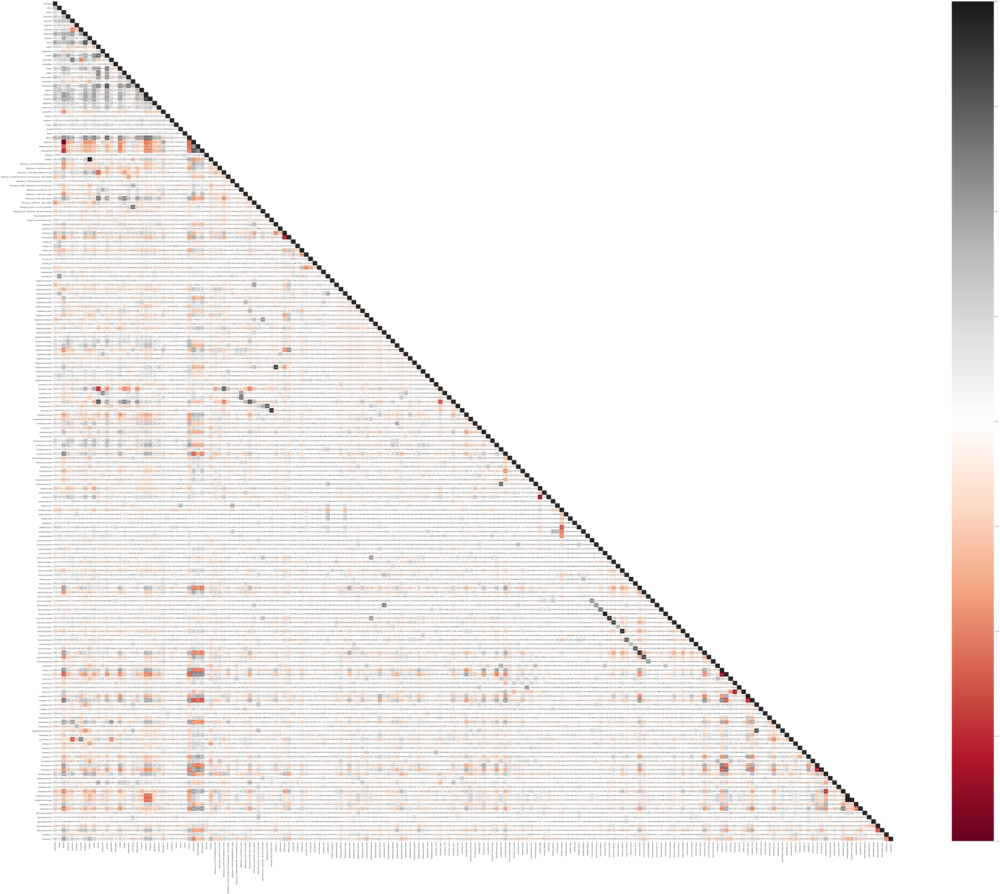

In [92]:
# Heatmap

cor_mat= housing.corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(150,110)
sns.heatmap(cor_mat, mask=mask, square=True, annot=True, cbar=True,cmap="RdGy")
plt.show()

In [93]:
# Dropping some highly correlated values from both train and test set

df_test=df_test.drop(['TotalBsmtSF','1stFlrSF','GrLivArea','BsmtFullBath','TotRmsAbvGrd','DiffYearBuilt', 'DiffYearRemodAdd','DiffGarageYrBlt','BsmtFinType1_Unf','KitchenQual_Gd','GarageType_Attchd','GarageType_No Garage','BsmtFinType1_No Basement','Neighborhood_Somerst','GarageCars','RoofStyle_Hip','MSZoning_RM','Exterior2nd_VinylSd','Exterior2nd_CBlock','Exterior2nd_CmentBd','Exterior2nd_HdBoard','Exterior2nd_MetalSd','Exterior2nd_Wd Sdng'],1)
df_train=df_train.drop(['TotalBsmtSF','1stFlrSF','GrLivArea','BsmtFullBath','TotRmsAbvGrd','DiffYearBuilt', 'DiffYearRemodAdd','DiffGarageYrBlt','BsmtFinType1_Unf','KitchenQual_Gd','GarageType_Attchd','GarageType_No Garage','BsmtFinType1_No Basement','Neighborhood_Somerst','GarageCars','RoofStyle_Hip','MSZoning_RM','Exterior2nd_VinylSd','Exterior2nd_CBlock','Exterior2nd_CmentBd','Exterior2nd_HdBoard','Exterior2nd_MetalSd','Exterior2nd_Wd Sdng'],1)


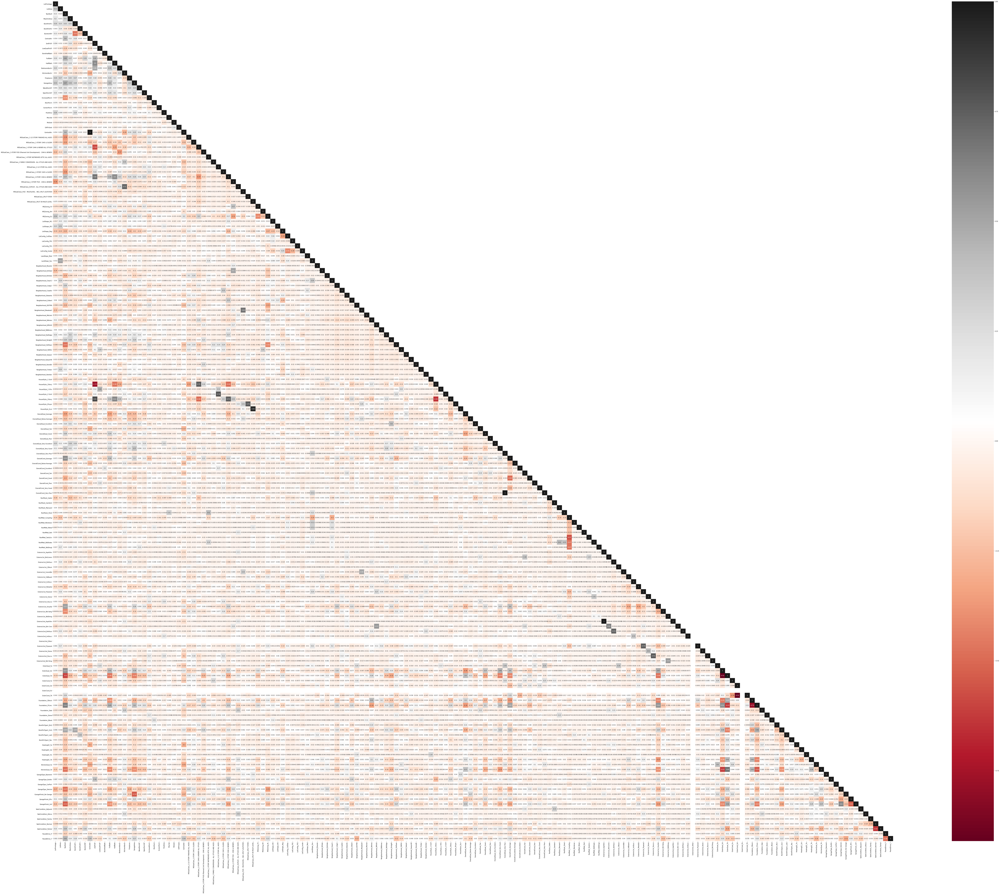

In [94]:
# Heatmap
# Checking the correlation Matrix Again
cor_mat= df_train.corr()
mask = np.array(cor_mat)
mask[np.tril_indices_from(mask)] = False
fig=plt.gcf()
fig.set_size_inches(150,110)
sns.heatmap(cor_mat, mask=mask, square=True, annot=True, cbar=True,cmap="RdGy")
plt.show()

#### From the above graph we can see that most of the variables have been taken care of but there is still some correlation left between the variables.

We can take a conservative approach here because there might be some variables which might be useful for the Model going ahead.

In [95]:
# Checking NA values in our Dataset
housing.isna().sum().sort_values(ascending=False)

PavedDrive_Y                                          0
MSSubClass_PUD - MULTILEVEL - INCL SPLIT LEV/FOYER    0
Neighborhood_Edwards                                  0
Neighborhood_Crawfor                                  0
Neighborhood_CollgCr                                  0
                                                     ..
Exterior1st_BrkFace                                   0
Exterior1st_BrkComm                                   0
Exterior1st_AsphShn                                   0
RoofMatl_WdShngl                                      0
LotFrontage                                           0
Length: 194, dtype: int64

### Step-5 Model Building

#### Building-Linear Regression Model

In [96]:
from sklearn.linear_model import LinearRegression

In [97]:
lm=LinearRegression()
#Fit a line
lm.fit(X_train,y_train)
# Print the coefficients and Interpret
print(lm.intercept_)
print(lm.coef_)

5.547873962859246
[ 9.75847744e-02  3.14616583e-01  1.41600355e-03  5.06229218e-02
  4.40500045e-01  6.20059030e-02  9.53326487e-02  4.58310314e-01
  1.54893018e-02  3.90255717e-01  2.64288820e-01 -3.90307324e-02
  4.24973152e-01  1.11590146e-01  3.78283361e-02  9.52219262e-02
  4.78897371e-02 -1.37601540e-02 -2.27116981e-01  1.11670285e-01
  8.32350169e-02  8.42147495e-02  1.45546468e-01  8.70761836e-02
 -6.66958702e-03  5.50709398e-02  9.06513536e-02  8.07300086e-02
  1.33251532e-01 -3.89053769e-02 -7.29460366e-03 -1.02608951e-05
 -6.30703347e-02 -3.04015636e-02  2.03201336e-02  1.54893018e-02
  1.24321034e-01 -1.45824731e-02  9.65718255e-02  6.87314405e-02
  6.70723549e-02  1.10005827e-01 -2.19605523e-02  1.28936026e-01
  9.43835674e-02  1.41750785e-02  1.38459737e-01  6.91466889e-02
  1.34733344e-01  4.49552199e-02  4.21440550e-01  4.14466351e-01
  3.95943068e-01  3.53726039e-01  2.77401961e-02  5.79691866e-02
  1.80441312e-02  4.55782162e-02 -2.30217622e-02 -3.04507681e-02
 -2.335

In [98]:
# Score on Train set
lm.score(X_train,y_train)

0.9385402179410617

In [99]:
# Score on Test set
lm.score(X_test,y_test)

0.8907431144711019

In [100]:
from sklearn.metrics import r2_score,mean_squared_error

In [101]:
y_pred_train=lm.predict(X_train)
y_pred_test=lm.predict(X_test)

In [102]:
# R-square Train set
metric=[]
r2_train_lr=r2_score(y_train,y_pred_train)
metric.append(r2_train_lr)
print(r2_train_lr)

0.9385402179410617


In [103]:
# R-square Test set
r2_test_lr=r2_score(y_test,y_pred_test)
print(r2_test_lr)
metric.append(r2_test_lr)

0.8907431144711019


In [104]:
#RSS
rss1_lr=np.sum(np.square(y_train-y_pred_train))
print(rss1_lr)
metric.append(rss1_lr)

9.86381823387108


In [105]:
#RSS
rss2_lr=np.sum(np.square(y_test-y_pred_test))
print(rss2_lr)
metric.append(rss2_lr)

7.8739876162686135


In [106]:
# Mean Squared Error Train set

mse_train_lr=mean_squared_error(y_train,y_pred_train)
print(mse_train_lr)
metric.append(mse_train_lr**0.5)

0.009660938524849245


In [107]:
# Mean Squared Error Test set
mse_test_lr=mean_squared_error(y_test,y_pred_test)
print(mse_test_lr)
metric.append(mse_test_lr**0.5)

0.01797714067641236


#### Here the R-square value which we got represents is actually 93.8% on Train Set and 89% on Test set.


#### Ridge Regression

In [108]:
from sklearn.preprocessing import PolynomialFeatures, MinMaxScaler
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.metrics import mean_squared_error, r2_score
from sklearn.model_selection import GridSearchCV

In [109]:
# List of alphas to tune if value is too high

params={'alpha':[0.0001,0.001,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,2.0,5.0,10.0,50.0,100.0,1000]}
ridge=Ridge()
# Cross validation
folds=5
model_cv=GridSearchCV(estimator=ridge,param_grid=params, scoring='neg_mean_absolute_error',cv=folds,return_train_score=True,verbose=1)
model_cv.fit(X_train,y_train)


Fitting 5 folds for each of 19 candidates, totalling 95 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  95 out of  95 | elapsed:    1.4s finished


GridSearchCV(cv=5, estimator=Ridge(),
             param_grid={'alpha': [0.0001, 0.001, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 5.0, 10.0,
                                   50.0, 100.0, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [110]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.001}


In [111]:
# Fitting the Ridge model for aplha=0.01 and printing coefficients which have been penalised.
alpha=0.01
ridge=Ridge(alpha=alpha)
ridge.fit(X_train,y_train)
print(ridge.coef_)

[ 6.60444855e-02  3.04788926e-01  1.39335537e-03  4.60834216e-02
  3.69656832e-01  5.40374268e-02  8.67249044e-02  3.87656908e-01
  1.59190506e-02  3.93230601e-01  2.68776722e-01 -3.10419846e-02
  4.30014125e-01  1.19430897e-01  4.18445264e-02  1.02709138e-01
  5.05969585e-02 -1.15417372e-02 -2.22223192e-01  1.12933577e-01
  8.38110494e-02  1.09547694e-01  1.23009964e-01  8.69990638e-02
 -4.81545905e-03  5.89084678e-02  9.56972808e-02  8.23275726e-02
  7.69743776e-02 -4.25074170e-02 -6.30583624e-03 -1.00967795e-05
 -6.31774172e-02 -2.44690916e-02  2.16079358e-02  1.59190506e-02
  1.20174888e-01 -2.38408731e-02  8.81420286e-02  5.22246537e-02
  5.16037305e-02  1.04887333e-01 -2.55988268e-03  1.19568440e-01
  7.94996899e-02 -3.17229392e-03  1.32141925e-01  5.27321409e-02
  1.27973855e-01  4.63693641e-02  4.13410630e-01  4.04889254e-01
  3.87550386e-01  3.46901028e-01  2.71618577e-02  4.29045158e-02
  1.75134186e-02  4.65086253e-02 -2.61408134e-02 -3.72941602e-02
 -2.75594169e-03  2.69034

In [112]:
# Again calculating the Rsquare, Residual Sum of Squares and Root Mean Squared Error

y_pred_train=ridge.predict(X_train)
y_pred_test=ridge.predict(X_test)

# R-square Train set
metric2=[]
r2_train_lr=r2_score(y_train,y_pred_train)
metric2.append(r2_train_lr)
print(r2_train_lr)

# R-square Test set
r2_test_lr=r2_score(y_test,y_pred_test)
print(r2_test_lr)
metric2.append(r2_test_lr)

#RSS(Residual Sum of Squares)-Train
rss1_lr=np.sum(np.square(y_train-y_pred_train))
print(rss1_lr)
metric2.append(rss1_lr)

#RSS(Residual Sum of Squares)-Test
rss2_lr=np.sum(np.square(y_test-y_pred_test))
print(rss2_lr)
metric2.append(rss2_lr)

# Mean Squared Error Train set

mse_train_lr=mean_squared_error(y_train,y_pred_train)
print(mse_train_lr)
metric2.append(mse_train_lr**0.5)

# Mean Squared Error Test set
mse_test_lr=mean_squared_error(y_test,y_pred_test)
print(mse_test_lr)
metric2.append(mse_test_lr**0.5)

0.9381510547777211
0.891384788370474
9.926275902575924
7.827743095267674
0.00972211155981971
0.017871559578236697


1. From __Ridge Regression__ R-square comes around 93.8% on Train set and 89% on the Test set
2. We get a __very low value of MSE value on both Train (0.009) and Test(0.017) set__.

In [113]:
cv_results = pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.013949,0.007401,0.005591,3.917777e-03,0.0001,{'alpha': 0.0001},-0.092495,-0.098660,-0.097611,-0.099815,...,-0.096079,0.003286,2,-0.067633,-0.067830,-0.059968,-0.067705,-0.067363,-0.066100,0.003070
1,0.008192,0.001837,0.003789,7.472971e-04,0.001,{'alpha': 0.001},-0.092377,-0.098652,-0.097580,-0.099614,...,-0.096034,0.003230,1,-0.067726,-0.067830,-0.060013,-0.067779,-0.067454,-0.066160,0.003076
2,0.006583,0.000489,0.002991,9.608003e-07,0.05,{'alpha': 0.05},-0.092958,-0.098297,-0.100477,-0.095631,...,-0.096735,0.002534,7,-0.071472,-0.067957,-0.064336,-0.071323,-0.071534,-0.069324,0.002837
3,0.006185,0.000400,0.003396,1.027499e-03,0.1,{'alpha': 0.1},-0.094485,-0.098023,-0.101978,-0.094663,...,-0.097414,0.002742,13,-0.073229,-0.068154,-0.066422,-0.073335,-0.073465,-0.070921,0.003018
4,0.005985,0.000892,0.002591,4.889477e-04,0.2,{'alpha': 0.2},-0.095278,-0.097628,-0.103045,-0.093681,...,-0.097694,0.003222,15,-0.074925,-0.068565,-0.068266,-0.075325,-0.075163,-0.072449,0.003297


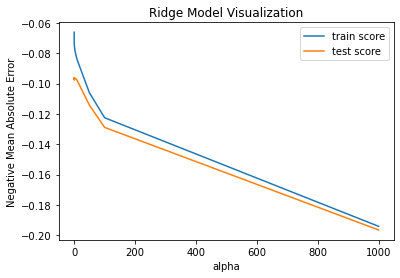

In [114]:
# Plot the mean test and train scores with alpha

cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Ridge Model Visualization")
plt.legend(['train score','test score'], loc='best')
plt.show();

#### The above graph shows the most negative value of mean absolute error for both Train and Test set

1. For Train set it is found to  be around -0.07.
2. For Test set it is found to be around-0.11.

### Lasso Regression

In [115]:
# List of alphas to tune if value is too high

params={'alpha':[0.0001,0.001,0.05,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0,2.0,5.0,10.0,50.0,100.0,1000]}
lasso=Lasso()
# Cross validation
folds=5
model_cv=GridSearchCV(estimator=lasso,param_grid=params, scoring='neg_mean_absolute_error',cv=folds,return_train_score=True,verbose=1)
model_cv.fit(X_train,y_train)

Fitting 5 folds for each of 19 candidates, totalling 95 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  95 out of  95 | elapsed:    2.1s finished


GridSearchCV(cv=5, estimator=Lasso(),
             param_grid={'alpha': [0.0001, 0.001, 0.05, 0.1, 0.2, 0.3, 0.4, 0.5,
                                   0.6, 0.7, 0.8, 0.9, 1.0, 2.0, 5.0, 10.0,
                                   50.0, 100.0, 1000]},
             return_train_score=True, scoring='neg_mean_absolute_error',
             verbose=1)

In [116]:
# Printing the best hyperparameter alpha
print(model_cv.best_params_)

{'alpha': 0.0001}


In [117]:
# Fitting the Ridge model for aplha=0.01 and printing coefficients which have been penalised.
alpha=0.0001
lasso=Lasso(alpha=alpha)
lasso.fit(X_train,y_train)
print(lasso.coef_)

[-0.00000000e+00  2.30946271e-01  1.58853005e-03  2.74602612e-02
  0.00000000e+00  0.00000000e+00  0.00000000e+00  2.05284628e-01
  4.26056581e-02  0.00000000e+00  4.01705027e-02 -5.58123569e-02
  1.02202233e+00  1.47348051e-01  4.15361127e-02  1.23226571e-01
  5.20222331e-02  0.00000000e+00 -1.86364226e-01  1.06933445e-01
  9.38446610e-02  1.95444498e-01  2.66999500e-02  8.12628394e-02
  4.20690452e-03  5.56938215e-02  6.62827878e-02  7.91580301e-02
 -7.71651129e-02 -0.00000000e+00 -4.78853781e-03 -0.00000000e+00
 -6.71447028e-02 -0.00000000e+00  2.28386269e-02  9.06655497e-04
  9.97822002e-03 -1.04066301e-01  1.10399333e-02 -5.83401768e-02
 -7.68053646e-03  7.35346167e-03  5.61206070e-04  1.55535726e-02
 -3.58511943e-02 -1.34067660e-01  4.34591187e-02 -4.34262074e-02
  2.56616583e-02  0.00000000e+00  2.95643320e-01  2.81229321e-01
  2.72076520e-01  2.29460128e-01  2.34686978e-02 -0.00000000e+00
  1.28332441e-02  5.17008921e-02 -2.61063395e-02 -1.26655362e-02
 -2.68733234e-03  2.17600

In [118]:
# Again calculating the Rsquare, Residual Sum of Squares and Root Mean Squared Error

y_pred_train=lasso.predict(X_train)
y_pred_test=lasso.predict(X_test)

# R-square Train set
metric3=[]
r2_train_lr=r2_score(y_train,y_pred_train)
metric3.append(r2_train_lr)
print(r2_train_lr)

# R-square Test set
r2_test_lr=r2_score(y_test,y_pred_test)
print(r2_test_lr)
metric3.append(r2_test_lr)

#RSS-Train
rss1_lr=np.sum(np.square(y_train-y_pred_train))
print(rss1_lr)
metric3.append(rss1_lr)

#RSS-Test
rss2_lr=np.sum(np.square(y_test-y_pred_test))
print(rss2_lr)
metric3.append(rss2_lr)

# Mean Squared Error Train set

mse_train_lr=mean_squared_error(y_train,y_pred_train)
print(mse_train_lr)
metric3.append(mse_train_lr**0.5)

# Mean Squared Error Test set
mse_test_lr=mean_squared_error(y_test,y_pred_test)
print(mse_test_lr)
metric3.append(mse_test_lr**0.5)

0.9289516834965837
0.8918410781789738
11.402703627230316
7.794858940789303
0.011168172014917058
0.01779648159997558


1. From __Lasso Regression__ R-square comes around 92.8% on Train set and 89% on the Test set
2. We get a __very low value of MSE value on both Train (0.01) and Test(0.017) set__.

In [119]:
cv_results=pd.DataFrame(model_cv.cv_results_)
cv_results.head()

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_alpha,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,...,mean_test_score,std_test_score,rank_test_score,split0_train_score,split1_train_score,split2_train_score,split3_train_score,split4_train_score,mean_train_score,std_train_score
0,0.068616,0.012382,0.003591,0.000798,0.0001,{'alpha': 0.0001},-0.089721,-0.096083,-0.099731,-0.090965,...,-0.093663,0.003712,1,-0.074135,-0.069153,-0.066516,-0.073672,-0.074466,-0.071588,0.003187
1,0.013363,0.001851,0.003192,0.000747,0.001,{'alpha': 0.001},-0.088743,-0.095156,-0.106396,-0.090716,...,-0.095154,0.006121,2,-0.087774,-0.080849,-0.081634,-0.086847,-0.087302,-0.084881,0.002997
2,0.008381,0.001350,0.005581,0.003765,0.05,{'alpha': 0.05},-0.238323,-0.237340,-0.243002,-0.222138,...,-0.238120,0.009124,3,-0.238359,-0.236336,-0.237863,-0.237962,-0.234544,-0.237013,0.001414
3,0.008778,0.001325,0.003988,0.000631,0.1,{'alpha': 0.1},-0.239622,-0.238672,-0.242933,-0.224661,...,-0.239843,0.009200,4,-0.239592,-0.238115,-0.237866,-0.242002,-0.237427,-0.239000,0.001668
4,0.007382,0.001354,0.003989,0.001412,0.2,{'alpha': 0.2},-0.239527,-0.238547,-0.242845,-0.224671,...,-0.239848,0.009292,5,-0.239660,-0.238127,-0.237897,-0.242021,-0.237466,-0.239034,0.001666


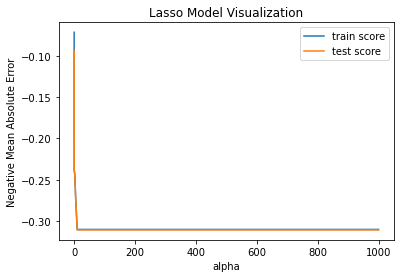

In [120]:
# Plot the mean test and train scores with alpha

cv_results['param_alpha'] = cv_results['param_alpha'].astype('float32')
plt.plot(cv_results['param_alpha'], cv_results['mean_train_score'])
plt.plot(cv_results['param_alpha'], cv_results['mean_test_score'])
plt.xlabel('alpha')
plt.ylabel('Negative Mean Absolute Error')
plt.title("Lasso Model Visualization")
plt.legend(['train score','test score'], loc='best')
plt.show();

In Lasso Regression:

1. Highest value of Mean Train score is found to be around -0.12
2. Highest value of Mean Test Score is found to be around -0.10.

In [121]:
# Creating a Table which contains all the metrics

lr_table={'Metric':['R2 Score(Train)','R2 Score(Test)','RSS(Train)','RSS(Test)','MSE(Train)','MSE(Test)'],'Linear Regression':metric}

lr_metric=pd.DataFrame(lr_table,columns=['Metric','Linear Regression'])
rg_metric=pd.Series(metric2,name='Ridge Regression')
ls_metric=pd.Series(metric3,name='Lasso Regression')

final_metric=pd.concat([lr_metric,rg_metric,ls_metric],axis=1)
final_metric

,Metric,Linear Regression,Ridge Regression,Lasso Regression
0,R2 Score(Train),0.938540,0.938151,0.928952
1,R2 Score(Test),0.890743,0.891385,0.891841
2,RSS(Train),9.863818,9.926276,11.402704
3,RSS(Test),7.873988,7.827743,7.794859
4,MSE(Train),0.098290,0.098601,0.105680
5,MSE(Test),0.134079,0.133685,0.133403


#### Lasso Model Parameters

In [122]:
# lasso model parameters
model_parameters = list(lasso.coef_)
model_parameters.insert(0, lasso.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = df_train.columns
cols = cols.insert(0, "constant")
lasso_coef=pd.DataFrame(list(zip(cols,model_parameters)))
lasso_coef.columns = ['Feature','Coef']
lasso_coef.sort_values(by='Coef',ascending=False).head(10)

,Feature,Coef
0,constant,7.295
13,HalfBath,1.022
123,Exterior1st_VinylSd,0.965
117,Exterior1st_HdBoard,0.812
121,Exterior1st_Stone,0.764
122,Exterior1st_Stucco,0.726
118,Exterior1st_ImStucc,0.715
120,Exterior1st_Plywood,0.691
119,Exterior1st_MetalSd,0.682
51,LotConfig_Inside,0.296


#### Ridge Model Parameters

In [123]:
# Ridge model parameters
model_parameters = list(ridge.coef_)
model_parameters.insert(0, ridge.intercept_)
model_parameters = [round(x, 3) for x in model_parameters]
cols = df_train.columns
cols = cols.insert(0, "constant")
ridge_coef=pd.DataFrame(list(zip(cols, model_parameters)))
ridge_coef.columns = ['Featuere','Coef']
ridge_coef.sort_values(by='Coef',ascending=False).head(10)

,Featuere,Coef
0,constant,6.033
123,Exterior1st_VinylSd,2.229
118,Exterior1st_ImStucc,2.193
119,Exterior1st_MetalSd,2.133
121,Exterior1st_Stone,2.117
120,Exterior1st_Plywood,2.102
117,Exterior1st_HdBoard,2.088
122,Exterior1st_Stucco,2.021
13,HalfBath,0.430
51,LotConfig_Inside,0.413


### Step-6 Final Predictions

After Performing Linear Regression, Ridge Regression and Lasso Regressio here are some of the take aways for Surprise Housing.

__Linear Regression__:

1. We got an R-square Value of 0.938 on the Train Set.
2. On Test we got R-square Value of 0.890

__Ridge Regression__:

1. We got an R-square vale of 0.938 on the Train set.
2. On the Test set I got an R-square Value of 0.891

__Lasso Regression__:

1. We got an R-square value of 0.928 on the Train set
2. On the Test I got an R-square vale of 0.891.

So, from our above model we can clearly see that in Linear Regression and In Ridge Regression we have almost the same values of Rsquare on both Train and Test set.

Whereas, in Lasso Regression we can see a dip in the R-square for Train set. So, we can opt for Ridge Regression for our dataset or Linear Regression.

__Top 5 significant variables for Lasso Regression__:

1. HalfBath	1.022
2. Exterior1st_VinylSd	0.965
3. Exterior1st_HdBoard	0.812
4. Exterior1st_Stone	0.764
5. Exterior1st_Stucco	0.726

__Top 5 significant variables for Ridge Regression__:

1. Exterior1st_VinylSd	2.229
2. Exterior1st_ImStucc	2.193
3. Exterior1st_MetalSd	2.133
4. Exterior1st_Stone	2.117
5. Exterior1st_Plywood	2.102

__Optimal value of Lambda for Ridge and Lasso:

1. __Ridge__: 0.001
2. __Lasso__: 0.0001    

From the Ridge Regression Model it is quite evident that the company"__Surprise Housing__" should focus on variables such as":

1. Exterior1st_VinylSd	2.229
2. Exterior1st_ImStucc	2.193
3. Exterior1st_MetalSd	2.133
4. Exterior1st_Stone	2.117
5. Exterior1st_Plywood	2.102

The top 5 variables are related to the Exterior of the Houses which means they are  important factor to be consdired during the Sale. 

For Exterior covering of the House the main coverings should be:

1. Vinyl Siding
2. Imitation Stucco
3. Metal Siding
4. Stone
5. Plywood